# Preprocessing of the data

In [1]:
%load_ext autoreload
%autoreload 2

# Imports
import matplotlib.pyplot as plt
import SimpleITK as sitk
import os
import numpy as np

In [2]:
# Custom imports
from preprocessing.utils import read_dicom_series, image_to_array, array_to_image
from preprocessing.preprocessing import downsample_image, reverse_slice_order, cutout_cast_HR_pQCT, cutout_calibration_phantom, outlier_elimination, reorient_PCCT_image, intensity_normalization, threshold_image
from preprocessing.multi_part_image import split_series, merge_series, merge_sitk_images

## HR-pQCT Images


In [3]:
# As the HR-pQCT images are very large, we will downsample them to a more manageable size
# Further as my machine does not have enough memory to load all the images at once, we will
# downsample them in batches of 3.

HR_pQCT_image_path = r"C:\Users\Yannick\Documents\repos\deep_femur_segmentation\data\HR-pQCT\13_2208_05302_R"


In [4]:
# Split the image into 3 parts
path_to_subfolders = split_series(HR_pQCT_image_path, 3)
print(path_to_subfolders)

['C:\\Users\\Yannick\\Documents\\repos\\deep_femur_segmentation\\data\\HR-pQCT\\13_2208_05302_R\\part_0', 'C:\\Users\\Yannick\\Documents\\repos\\deep_femur_segmentation\\data\\HR-pQCT\\13_2208_05302_R\\part_1', 'C:\\Users\\Yannick\\Documents\\repos\\deep_femur_segmentation\\data\\HR-pQCT\\13_2208_05302_R\\part_2']


### Load and downsample images in 3 batches

['C:\\Users\\Yannick\\Documents\\repos\\deep_femur_segmentation\\data\\HR-pQCT\\13_2208_05302_R\\part_0', 'C:\\Users\\Yannick\\Documents\\repos\\deep_femur_segmentation\\data\\HR-pQCT\\13_2208_05302_R\\part_1', 'C:\\Users\\Yannick\\Documents\\repos\\deep_femur_segmentation\\data\\HR-pQCT\\13_2208_05302_R\\part_2']


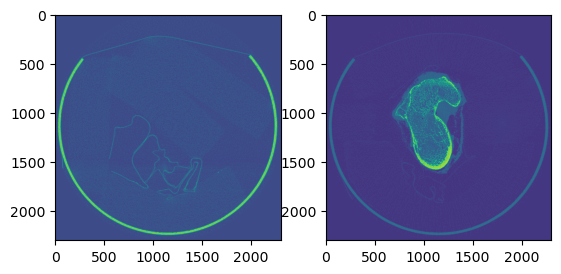

 path: C:\Users\Yannick\Documents\repos\deep_femur_segmentation\data\HR-pQCT\13_2208_05302_R\part_0, size: (2304, 2304, 780), spacing: (0.06069965, 0.06069965, 0.060699871630295256)
 path: C:\Users\Yannick\Documents\repos\deep_femur_segmentation\data\HR-pQCT\13_2208_05302_R\part_0, size: (1152, 1152, 390), spacing: (0.1213993, 0.1213993, 0.12139974326059051)


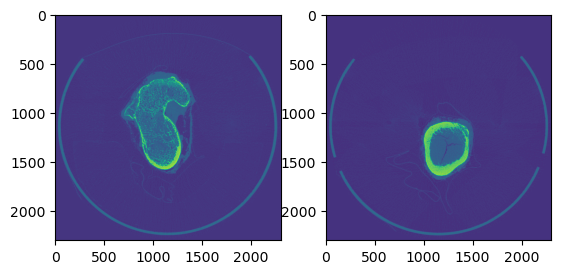

 path: C:\Users\Yannick\Documents\repos\deep_femur_segmentation\data\HR-pQCT\13_2208_05302_R\part_1, size: (2304, 2304, 780), spacing: (0.06069965, 0.06069965, 0.060699871630295235)
 path: C:\Users\Yannick\Documents\repos\deep_femur_segmentation\data\HR-pQCT\13_2208_05302_R\part_1, size: (1152, 1152, 390), spacing: (0.1213993, 0.1213993, 0.12139974326059047)


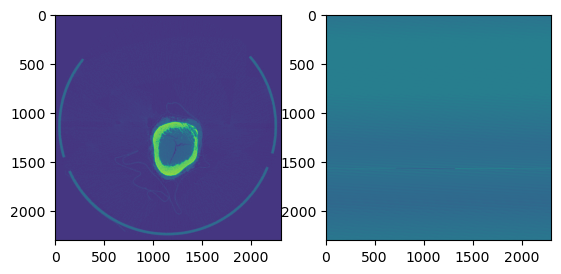

 path: C:\Users\Yannick\Documents\repos\deep_femur_segmentation\data\HR-pQCT\13_2208_05302_R\part_2, size: (2304, 2304, 779), spacing: (0.06069965, 0.06069965, 0.06069987146529564)
 path: C:\Users\Yannick\Documents\repos\deep_femur_segmentation\data\HR-pQCT\13_2208_05302_R\part_2, size: (1152, 1152, 389), spacing: (0.1213993, 0.1213993, 0.12139974293059128)


In [5]:
path_to_subfolders = os.listdir(HR_pQCT_image_path)
path_to_subfolders = [os.path.join(HR_pQCT_image_path, path) for path in path_to_subfolders if path.startswith("part")]
print(path_to_subfolders)
down_sampled_images = []
for path in path_to_subfolders:
    image = read_dicom_series(path)
    # display the first and last slice of the image
    fig, ax = plt.subplots(1,2)
    sitk.GetArrayFromImage
    ax[0].imshow(sitk.GetArrayFromImage(image[:,:,0]))
    ax[1].imshow(sitk.GetArrayFromImage(image[:,:,-1]))
    plt.show()

    print(f" path: {path}, size: {image.GetSize()}, spacing: {image.GetSpacing()}")

    # Downsample the image
    image = downsample_image(image, 2)

    print(f" path: {path}, size: {image.GetSize()}, spacing: {image.GetSpacing()}")

    down_sampled_images.append(image)

 path: C:\Users\Yannick\Documents\repos\deep_femur_segmentation\data\HR-pQCT\13_2208_05302_R\part_2, size: (1152, 1152, 1169), spacing: (0.1213993, 0.1213993, 0.12139974326059051)


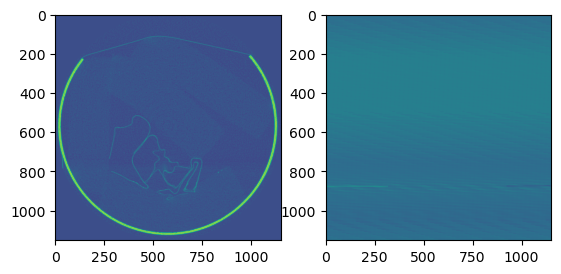

In [6]:
# merge the images back together
image = merge_sitk_images(down_sampled_images)
print(f" path: {path}, size: {image.GetSize()}, spacing: {image.GetSpacing()}")
# display the first and last slice of the image
fig, ax = plt.subplots(1,2)
ax[0].imshow(sitk.GetArrayFromImage(image[:,:,0]))
ax[1].imshow(sitk.GetArrayFromImage(image[:,:,-1]))
plt.show()

### Remove the Cast

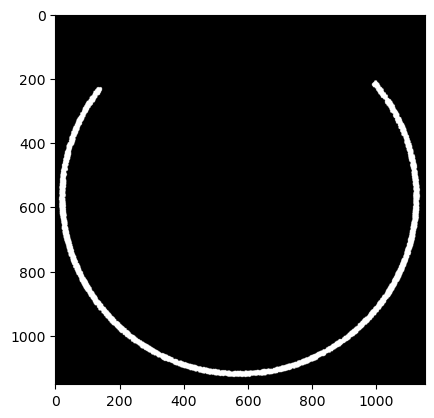

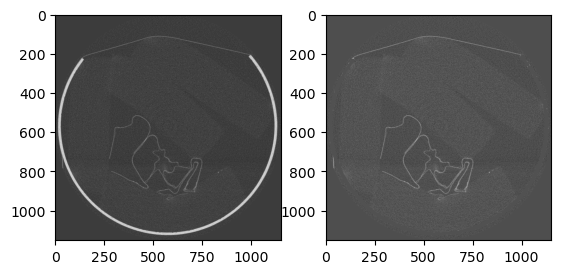

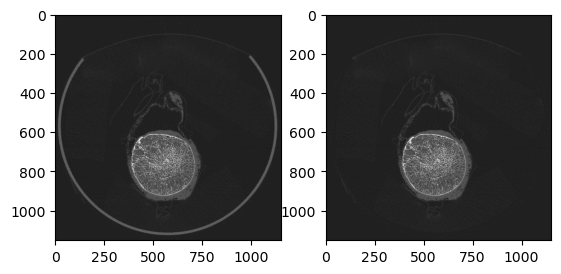

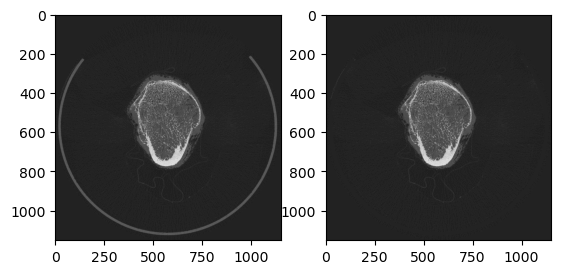

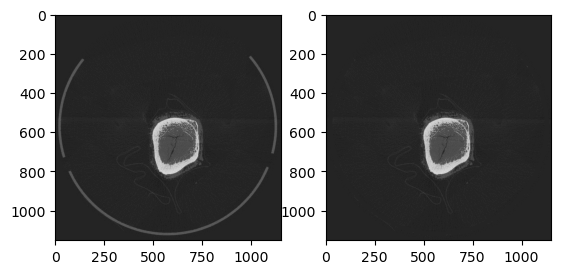

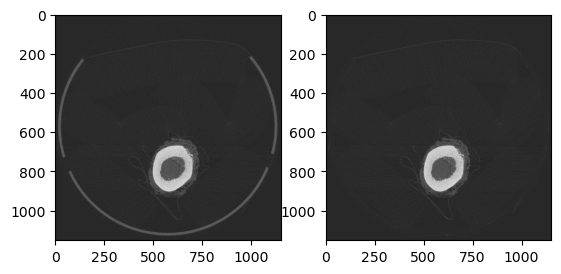

In [7]:
no_cast, mask = cutout_cast_HR_pQCT(image[:,:,::50])

plt.imshow(mask[:,:,0], cmap="gray")
plt.show()

#  Show the first slice of the image
for i in range(0, no_cast.GetDepth(), 5):
    fig, ax = plt.subplots(1,2)
    ax[0].imshow(sitk.GetArrayFromImage(image[:,:,i*50]), cmap="gray")
    ax[1].imshow(sitk.GetArrayFromImage(no_cast[:,:,i]), cmap="gray")
    plt.show()

image, _ = cutout_cast_HR_pQCT(image)

In [8]:
# image = intensity_normalization(image)

In [8]:
# Set Direction and Origin
image.SetDirection([1,0,0,0,1,0,0,0,1])
image.SetOrigin([0,0,0])

In [9]:
sitk.WriteImage(image, os.path.join(HR_pQCT_image_path, "downsampled_image_cut_cast.nii.gz"))

## PCCT preprocessing

In [53]:
base_path = r"C:\Users\Yannick\Documents\repos\deep_femur_segmentation\data"
sample = "13_2208_05302_R"
path_to_hr_image = os.path.join(base_path, "HR-pQCT", sample, "downsampled_image_cut_cast.nii.gz")

In [54]:
# Find PCCT sample folder 
path_to_pcc_image = [folder for folder in os.listdir(os.path.join(base_path, "PCCT")) if sample in folder][0]
path_to_pcc_image_folder = os.path.join(base_path, "PCCT", path_to_pcc_image)
path_to_pcc_image = os.path.join(path_to_pcc_image_folder, [folder for folder in os.listdir(path_to_pcc_image_folder) if "Ex_vivo_bone" in folder][0])
print(path_to_pcc_image)

C:\Users\Yannick\Documents\repos\deep_femur_segmentation\data\PCCT\9_2209_05992_L\9_Ex_vivo_bone_0_20_Br89_Q3_L_5


In [55]:
reader = sitk.ImageSeriesReader()
# dicom_names = reader.GetGDCMSeriesFileNames(path_to_pcc_image)
reader.SetFileNames([os.path.join(path_to_pcc_image ,file) for file in os.listdir(path_to_pcc_image) if file.endswith(".dcm")])

image = reader.Execute()
print(image.GetDirection())
print(image.GetOrigin())
print(image.GetSpacing())
print(image.GetSize())


(-1.0, 0.0, 0.0, 0.0, -1.0, 0.0, 0.0, 0.0, 1.0)
(60.97705859375, 169.94805859375, -1088.685)
(0.1298828125, 0.1298828125, 0.10046269805175032)
(1024, 1024, 5248)


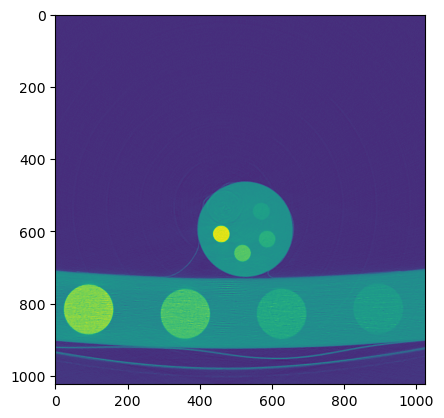

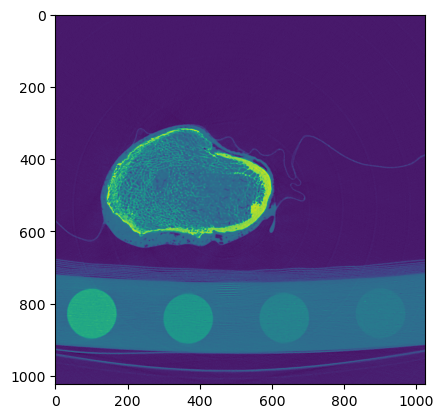

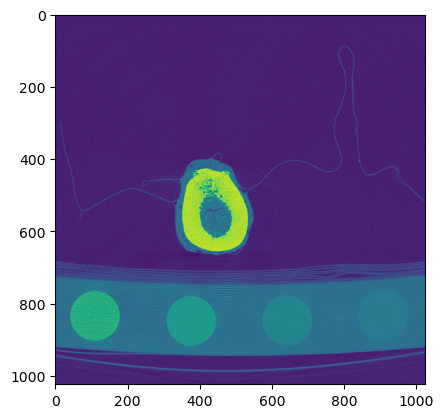

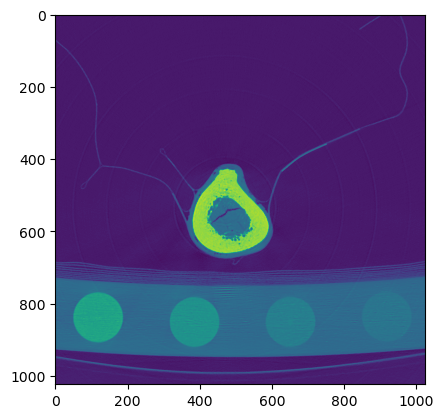

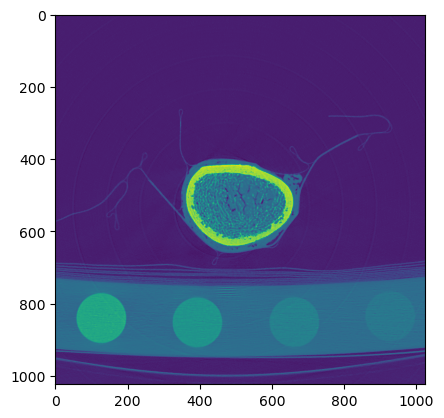

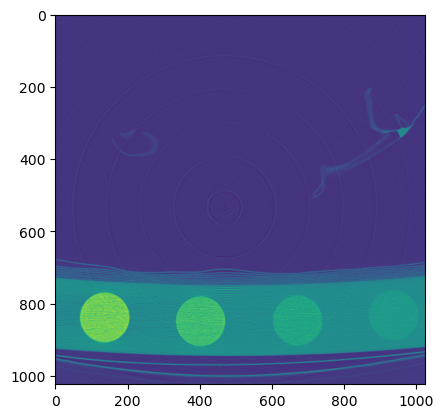

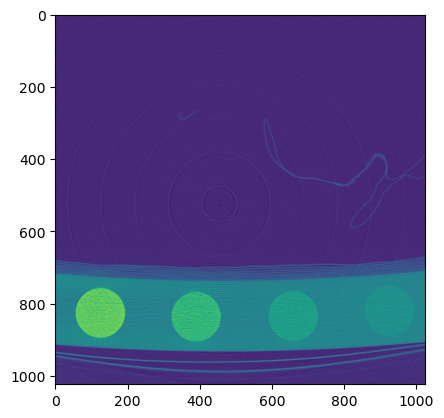

In [56]:
# Display some slices of the image
for i in range(0, image.GetDepth(), 1000):
    plt.imshow(sitk.GetArrayFromImage(image[:,:,i]))
    plt.show()
plt.imshow(sitk.GetArrayFromImage(image[:,:,-1]))
plt.show()



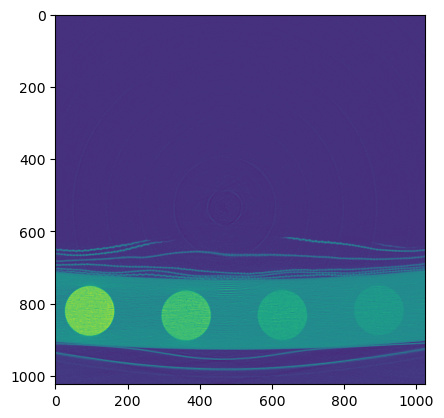

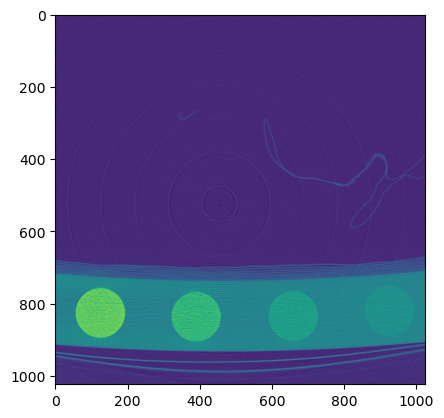

In [57]:
# Cut away last slices with the calibration phantom
image = image[:,:,300:]
# Display last slice
plt.imshow(sitk.GetArrayFromImage(image[:,:,0]))
plt.show()
plt.imshow(sitk.GetArrayFromImage(image[:,:,image.GetDepth()-1]))

In [58]:
# Cut out the calibration phantom
image_cut = cutout_calibration_phantom(image)

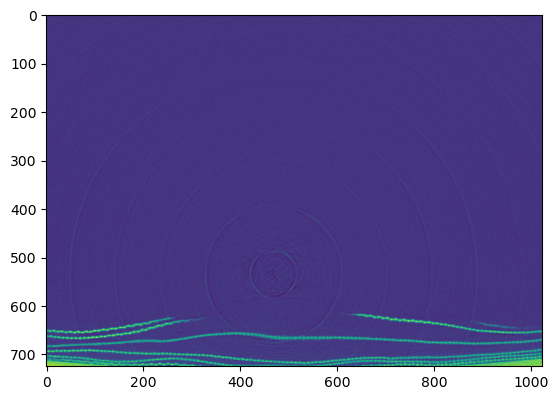

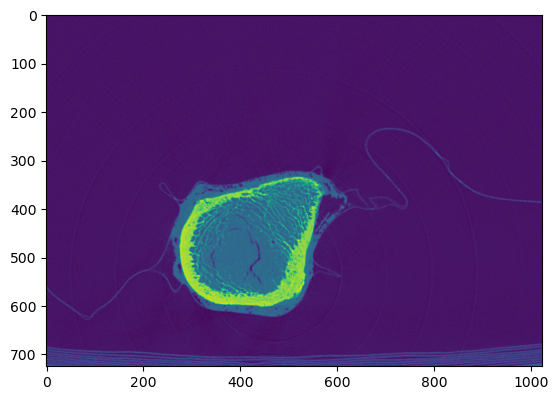

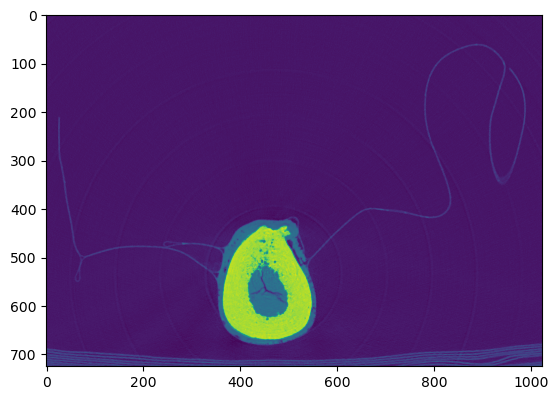

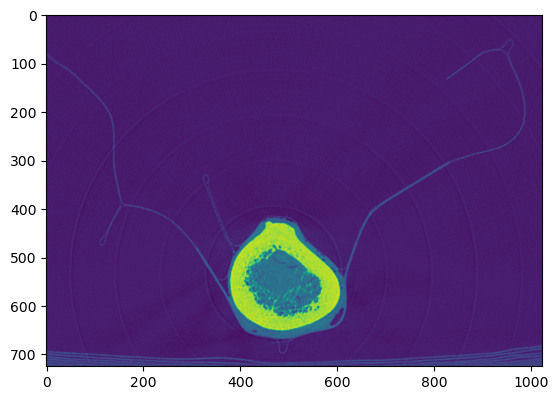

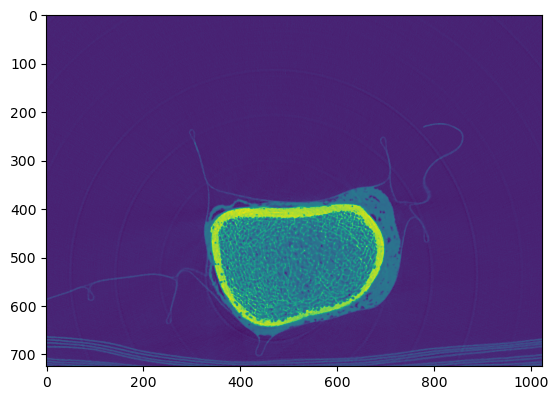

In [59]:
for i in range(0, image_cut.GetDepth(), 1000):
    plt.imshow(sitk.GetArrayFromImage(image_cut[:,:,i]))
    plt.show()

In [60]:
print(path_to_hr_image)

C:\Users\Yannick\Documents\repos\deep_femur_segmentation\data\HR-pQCT\9_2209_05992_L\downsampled_image_cut_cast.nii.gz


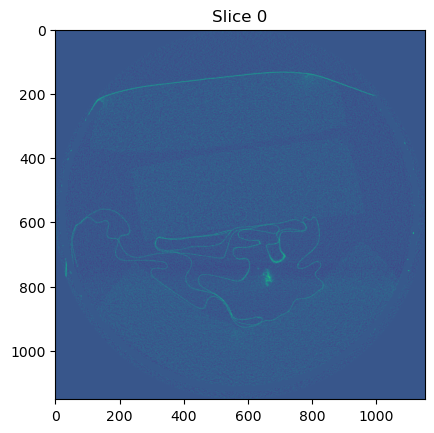

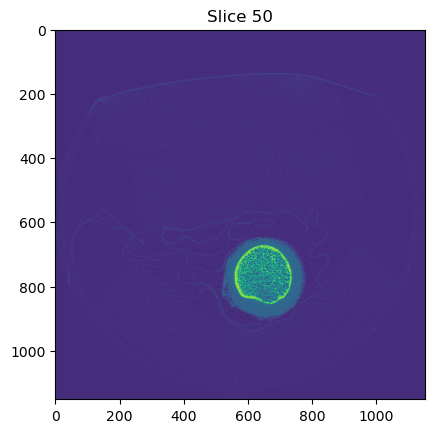

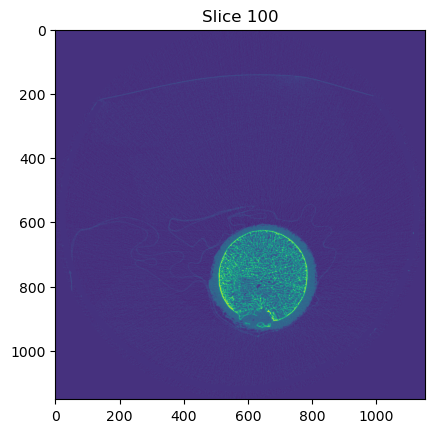

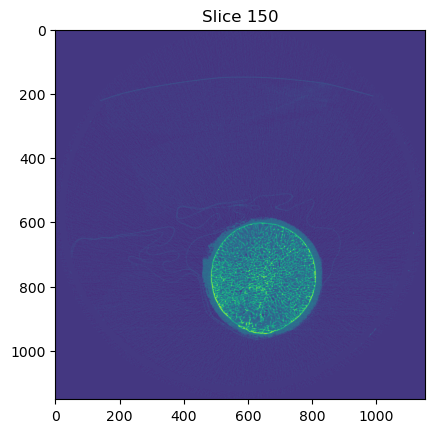

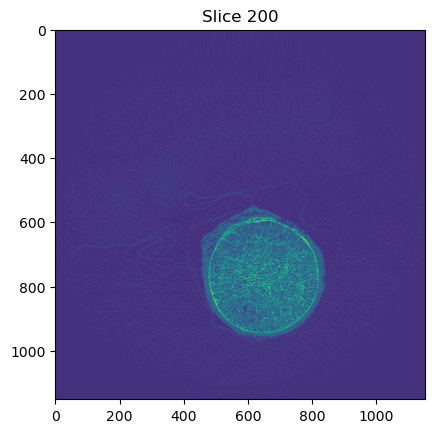

...

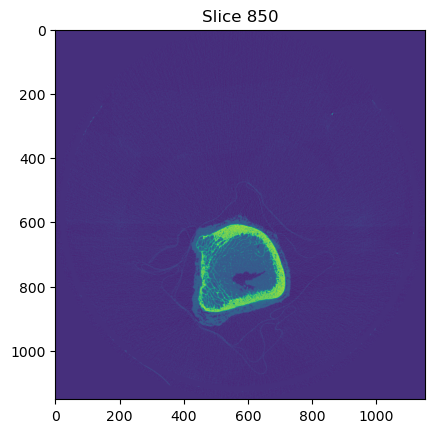

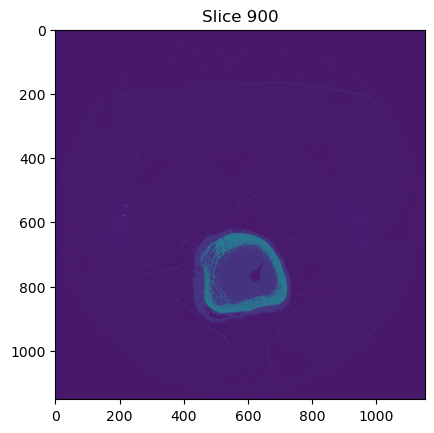

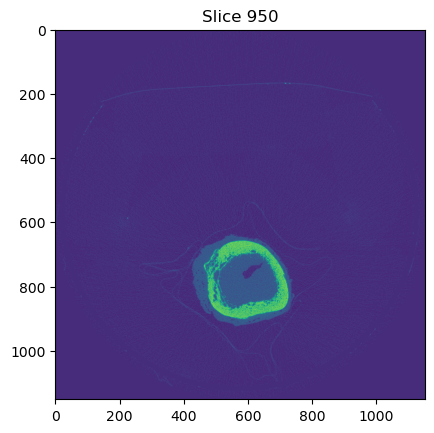

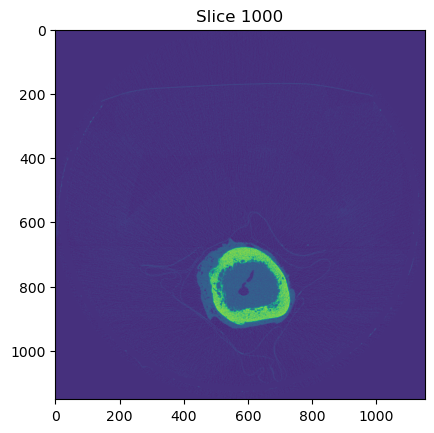

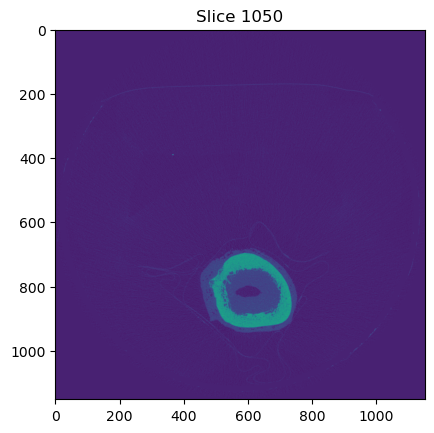

In [61]:
# load hr image and display some slices
hr_image = sitk.ReadImage(path_to_hr_image)

for i in range(0, hr_image.GetDepth(), 50):
    plt.imshow(sitk.GetArrayFromImage(hr_image[:,:,i]))
    plt.title(f"Slice {i}")
    plt.show()



C:\Users\Yannick\Documents\repos\deep_femur_segmentation\data\HR-pQCT\9_2209_05992_L\downsampled_image_cut_cast.nii.gz
C:\Users\Yannick\Documents\repos\deep_femur_segmentation\data\PCCT\9_2209_05992_L\9_Ex_vivo_bone_0_20_Br89_Q3_L_5


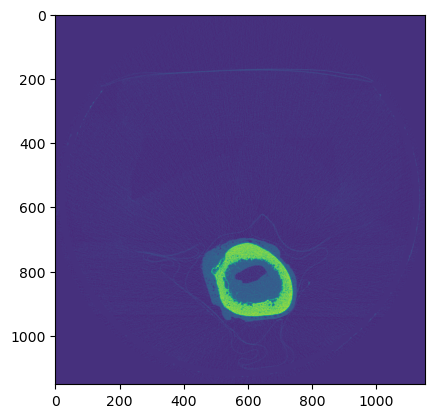

In [62]:
# Reorient the image to fit the HR-pQCT image k might need to be adjusted on a per image basis
# image_cut = reorient_PCCT_image(image_cut, k=-1)
print(path_to_hr_image)
print(path_to_pcc_image)
plt.imshow(sitk.GetArrayFromImage(hr_image[:,:,-1]))
plt.show()

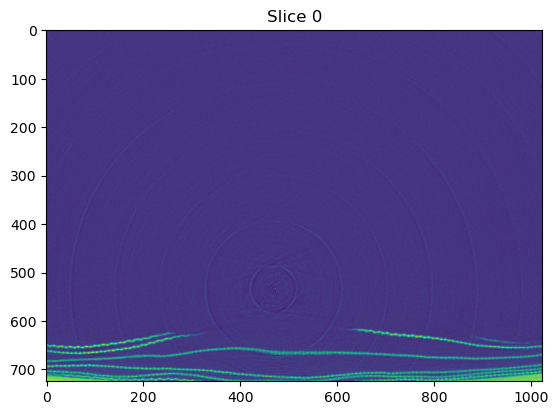

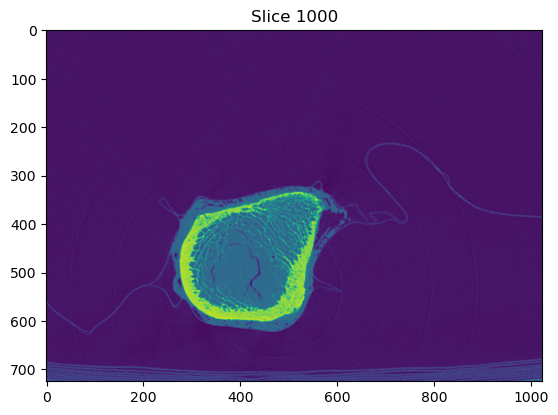

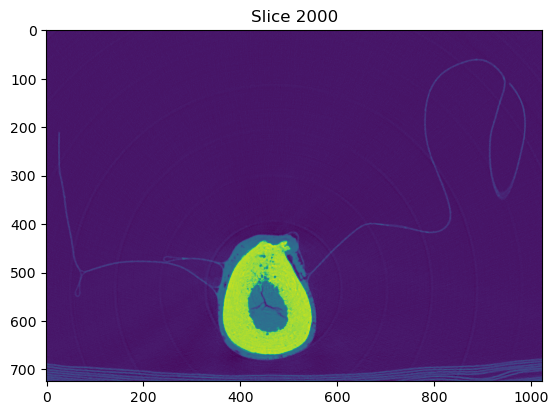

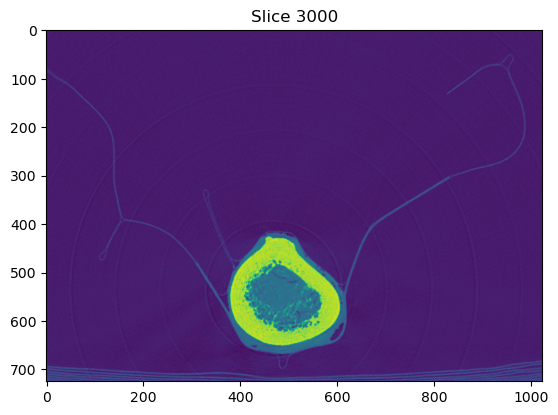

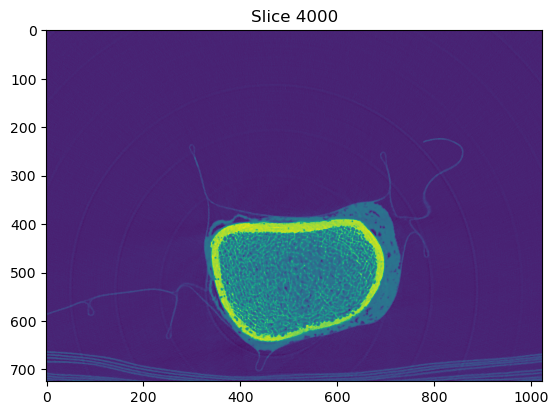

In [65]:
array = sitk.GetArrayFromImage(image_cut)
#array = array[:,::-1,:]

for i in range(0, image_cut.GetDepth(), 1000):
    plt.imshow(array[i,:,:])
    plt.title(f"Slice {i}")
    plt.show()

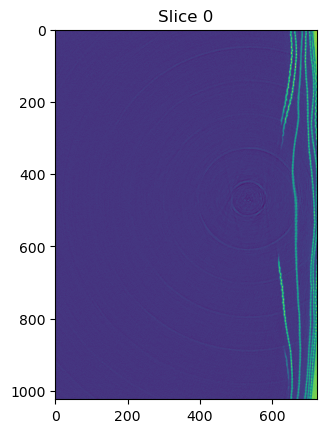

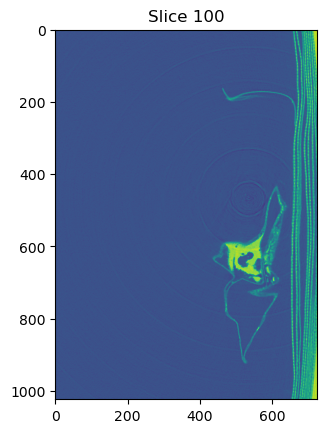

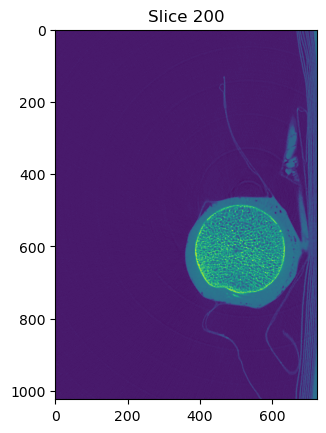

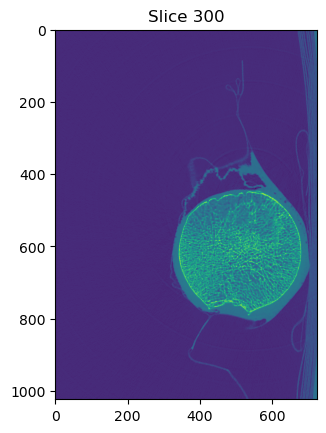

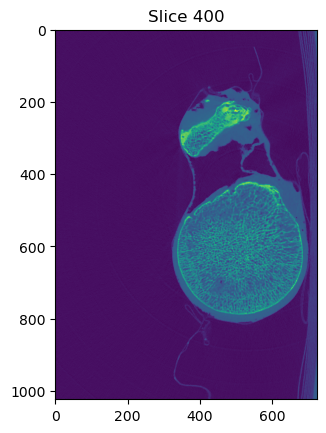

...

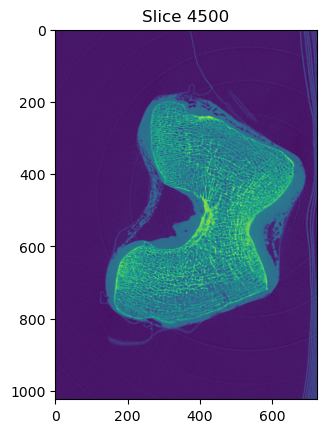

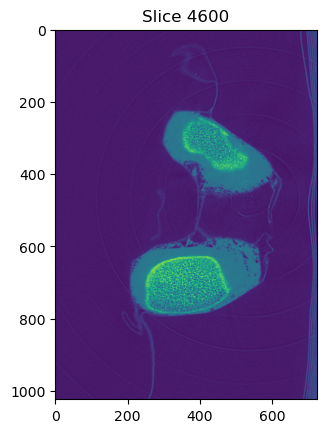

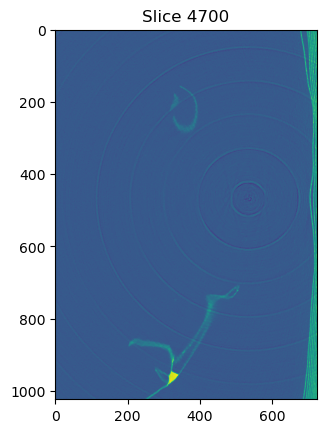

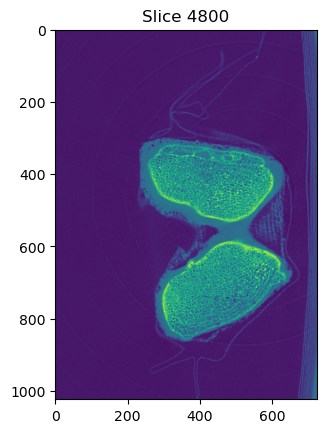

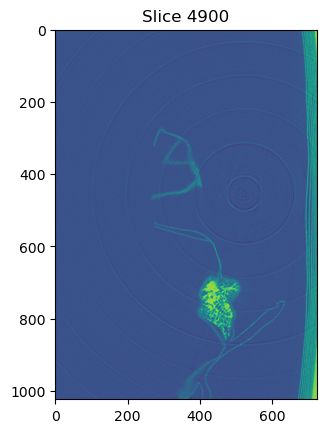

In [69]:
array = np.rot90(array, k=2, axes=(1,2))
#array = array[:,:,::-1]
for i in range(0, image_cut.GetDepth(), 100):
    plt.imshow(array[i,:,:])
    plt.title(f"Slice {i}")
    plt.show()

In [14]:
image = sitk.ReadImage(path_to_pcc_image + r"\..\cutout_calibration_phantom.nii.gz")
# array = sitk.GetArrayFromImage(image_cut)

In [70]:
array = array[:1400,:,:]

In [71]:
image_cut = sitk.GetImageFromArray(array)
image_cut.SetSpacing(image.GetSpacing())
image_cut.SetDirection(image.GetDirection())
image_cut.SetOrigin(image.GetOrigin())

In [72]:
image_cut.SetDirection([1,0,0,0,1,0,0,0,1])
image_cut.SetOrigin([0,0,0])


In [73]:
sitk.WriteImage(image_cut, os.path.join(path_to_pcc_image_folder, "cutout_calibration_phantom.nii.gz"))

In [74]:
print(path_to_pcc_image_folder)

C:\Users\Yannick\Documents\repos\deep_femur_segmentation\data\PCCT\9_2209_05992_L


# Thresholding 
(only for the registraion of the images)

In [75]:
image_cut = threshold_image(intensity_normalization(image_cut), fraction=0.97, sparse=True)
hr_image = threshold_image(intensity_normalization(hr_image), fraction=0.97, sparse=True)


Threshold value: 948.6733362331448
Number of voxels above threshold: 31266041
Fraction of voxels above threshold: 0.030082012969519706
Threshold value: 292.75035260929
Number of voxels above threshold: 43491871
Fraction of voxels above threshold: 0.030093676859388994


In [76]:
sitk.WriteImage(hr_image,  os.path.join(base_path, "HR-pQCT", sample, "downsampled_image_cut_97.nii.gz"))
sitk.WriteImage(image_cut, os.path.join(path_to_pcc_image_folder, "cutout_calibration_phantom_97.nii.gz"))

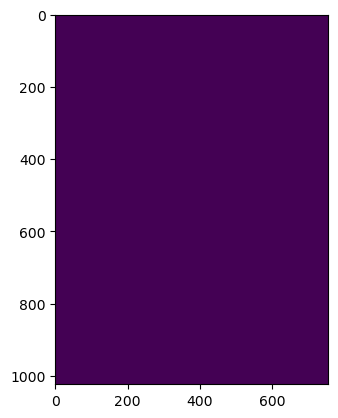

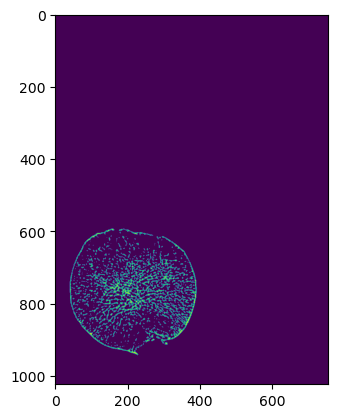

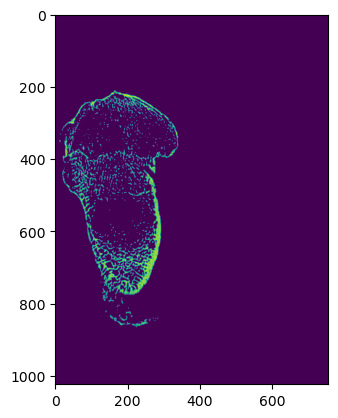

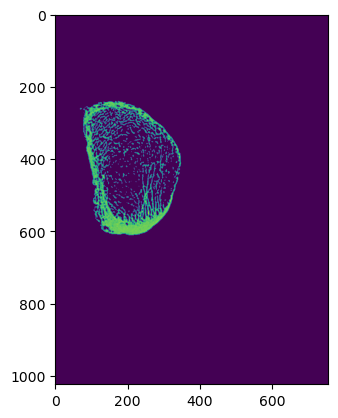

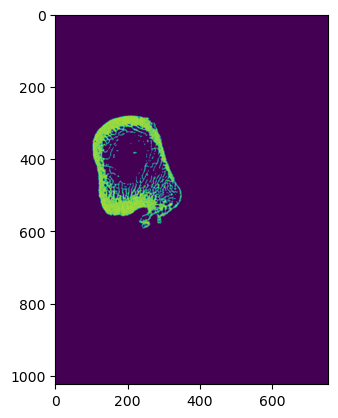

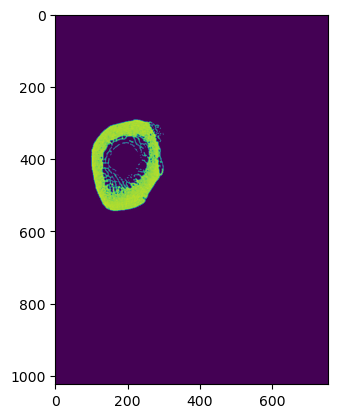

In [52]:
# Display some slices of the image
for i in range(0, image_cut.GetDepth(), 250):
    plt.imshow(sitk.GetArrayFromImage(image_cut[:,:,i]))
    plt.show()
